# Artificial Intelligence Exam Project | Fake and real news detector
 
##### Created by Andreas Guldborg Heick

## Objective
The objective of this task is to enable you to demonstrate the knowledge of artificial intelligence and machine learning acquired during the elective AI course.

The task is to create a machine learning based solution to a real life problem.


## Dataset Information
I chose the Fake and real news dataset from Kaggle, which is linked [here](https://datsoftlyngby.github.io/soft2020spring/resources/32351e43-ExamTask.pdf).


This Dataset is a collection of news stories including both fake and real news stories.
The assignment I have chosen to do is to create a model that can distinguish between fake news and real news based on the kaggle dataset. Since this is a dataset with known labels I am going to use Supervised Learning Models for my predictions.

## Classification or Regression
#### Classification
I chose to use classification because it predicts by putting some data into classes or categories. And I need to put a news story in either the category true or fake news.
This is what classification does, it tells us which discrete category our data fall into by predicting discrete values.

Classification uses a method of measuring accuracy.

#### Regression
Regression on the other hand predicts values like the height of a human or their age.
It is based on continuous values, meaning the values can be infinite and not countable.

Regression uses a method of measurement of root mean square error.

<br>
<br>

## WARNING: It takes quite some time to run all cells!
### Expect execution times of minimum 15 minutes
### Since everything is pickled I recommend just running the app.py file
#### How?
* Just type this in your prefered console or terminal
```
python app.py
```

* or run the last code cell of the project containing the command !python app.py
<br>


## Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import feature_extraction, linear_model, model_selection, preprocessing
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline

from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import nltk
import nltk as nlp
import string
import re
from wordcloud import WordCloud
import pickle
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

import time
import datetime
# times program
start_time = time.time()

## Dataset

https://www.kaggle.com/clmentbisaillon/fake-and-real-news-dataset

In [2]:
# Load both csv's
true_df = pd.read_csv("fake-and-real-news-dataset/True.csv")
fake_df = pd.read_csv("fake-and-real-news-dataset/Fake.csv")

In [3]:
# add target identifiers to differentiate fakes and trues 
fake_df['target'] = 'fake'
true_df['target'] = 'true'

# merge the two dataframes into one
news = pd.concat([fake_df, true_df]).reset_index(drop = True)

## Exploratory Data Analysis

Let's take a look at the data we are working with

In [4]:
true_df.head()

,title,text,subject,date,target
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",true
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",true
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",true
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",true
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",true


In [5]:
fake_df.head()

,title,text,subject,date,target
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",fake
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",fake
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",fake
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",fake
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",fake


In [6]:
news.head()

,title,text,subject,date,target
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",fake
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",fake
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",fake
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",fake
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",fake


In [7]:
news.tail()

,title,text,subject,date,target
44893,'Fully committed' NATO backs new U.S. approach...,BRUSSELS (Reuters) - NATO allies on Tuesday we...,worldnews,"August 22, 2017",true
44894,LexisNexis withdrew two products from Chinese ...,"LONDON (Reuters) - LexisNexis, a provider of l...",worldnews,"August 22, 2017",true
44895,Minsk cultural hub becomes haven from authorities,MINSK (Reuters) - In the shadow of disused Sov...,worldnews,"August 22, 2017",true
44896,Vatican upbeat on possibility of Pope Francis ...,MOSCOW (Reuters) - Vatican Secretary of State ...,worldnews,"August 22, 2017",true
44897,Indonesia to buy $1.14 billion worth of Russia...,JAKARTA (Reuters) - Indonesia will buy 11 Sukh...,worldnews,"August 22, 2017",true


In [8]:
# see the available columns
list(news)

['title', 'text', 'subject', 'date', 'target']

In [9]:
# count target values
news.target.value_counts()

fake    23481
true    21417
Name: target, dtype: int64

In [10]:
# Describe dataset
news.describe()

,title,text,subject,date,target
count,44898,44898,44898,44898,44898
unique,38729,38646,8,2397,2
top,Factbox: Trump fills top jobs for his administ...,,politicsNews,"December 20, 2017",fake
freq,14,627,11272,182,23481


In [11]:
# Describe the different targets
news.groupby('target').describe()

title                                                                 \
        count unique                                                top freq   
target                                                                         
fake    23481  17903  MEDIA IGNORES Time That Bill Clinton FIRED His...    6   
true    21417  20826  Factbox: Trump fills top jobs for his administ...   14   

         text                                                                 \
        count unique                                                top freq   
target                                                                         
fake    23481  17455                                                     626   
true    21417  21192  (Reuters) - Highlights for U.S. President Dona...    8   

       subject                               date                             \
         count unique           top   freq  count unique                 top   
target                                                                         
fake     23481      6          News   9050  23481   1681        May 10, 2017   
true     21417      2  politicsNews  11272  21417    716  December 20, 2017    

             
       freq  
target       
fake     46  
true    182

In [12]:
# Look at the first news story text to see clearly what we are dealing with
news.iloc[0].text

'Donald Trump just couldn t wish all Americans a Happy New Year and leave it at that. Instead, he had to give a shout out to his enemies, haters and  the very dishonest fake news media.  The former reality show star had just one job to do and he couldn t do it. As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year,  President Angry Pants tweeted.  2018 will be a great year for America! As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year. 2018 will be a great year for America!  Donald J. Trump (@realDonaldTrump) December 31, 2017Trump s tweet went down about as welll as you d expect.What kind of president sends a New Year s greeting like this despicable, petty, infantile gibberish? Only Trump! His lack of decency won t ev

In [13]:
# Display news subjects for fakes
print("Fake news subjects:")
for key, count in fake_df.subject.value_counts().iteritems():
    print(f"* {key}: {count}")
    
# Display total subject amount
print(f"Total Subject Amount: {fake_df.shape[0]}")

Fake news subjects:
* News: 9050
* politics: 6841
* left-news: 4459
* Government News: 1570
* US_News: 783
* Middle-east: 778
Total Subject Amount: 23481


In [14]:
# Display news subjects for trues
print("True news subjects:")
for key, count in true_df.subject.value_counts().iteritems():
    print(f"* {key}: {count}")
    
# Display total subject amount
print(f"Total Subject Amount: {true_df.shape[0]}")

True news subjects:
* politicsNews: 11272
* worldnews: 10145
Total Subject Amount: 21417


## First Data Cleaning

After looking at the data we are dealing with I noticed that the text column is poluted with many signs and twitter handles, so I decided to remove those.

In [15]:
lemma = WordNetLemmatizer()
stop = stopwords.words('english')

def clean_text(text):
    # make everything lowercase
    text = text.lower()
    # remove special characters, numbers, punctuations
    text = re.sub("[^a-zA-Z ]+", " ", text)
    
    #tokenization, separating words from sentences
    words = word_tokenize(text)
    
    # remove stopwords
    words_stop=[]
    for word in words :
        if word in stop:continue
        words_stop.append(word)
    # lemmatize the words to get the base form then recreate the text
    return (' '.join([lemma.lemmatize(word) for word in words_stop]))

In [16]:
# clean the combined text
news['text'] = news['text'].apply(lambda x: clean_text(x))
news

,title,text,subject,date,target
0,Donald Trump Sends Out Embarrassing New Year’...,donald trump wish american happy new year leav...,News,"December 31, 2017",fake
1,Drunk Bragging Trump Staffer Started Russian ...,house intelligence committee chairman devin nu...,News,"December 31, 2017",fake
2,Sheriff David Clarke Becomes An Internet Joke...,friday revealed former milwaukee sheriff david...,News,"December 30, 2017",fake
3,Trump Is So Obsessed He Even Has Obama’s Name...,christmas day donald trump announced would bac...,News,"December 29, 2017",fake
4,Pope Francis Just Called Out Donald Trump Dur...,pope francis used annual christmas day message...,News,"December 25, 2017",fake
...,...,...,...,...,...
44893,'Fully committed' NATO backs new U.S. approach...,brussels reuters nato ally tuesday welcomed pr...,worldnews,"August 22, 2017",true
44894,LexisNexis withdrew two products from Chinese ...,london reuters lexisnexis provider legal regul...,worldnews,"August 22, 2017",true
44895,Minsk cultural hub becomes haven from authorities,minsk reuters shadow disused soviet era factor...,worldnews,"August 22, 2017",true
44896,Vatican upbeat on possibility of Pope Francis ...,moscow reuters vatican secretary state cardina...,worldnews,"August 22, 2017",true


In [17]:
# a second look on the now cleaned text
news.iloc[0].text

'donald trump wish american happy new year leave instead give shout enemy hater dishonest fake news medium former reality show star one job country rapidly grows stronger smarter want wish friend supporter enemy hater even dishonest fake news medium happy healthy new year president angry pant tweeted great year america country rapidly grows stronger smarter want wish friend supporter enemy hater even dishonest fake news medium happy healthy new year great year america donald j trump realdonaldtrump december trump tweet went welll expect kind president sends new year greeting like despicable petty infantile gibberish trump lack decency even allow rise gutter long enough wish american citizen happy new year bishop talbert swan talbertswan december one like calvin calvinstowell december impeachment would make great year america also accept regaining control congress miranda yaver mirandayaver december hear talk include many people hate wonder hate alan sandoval alansandoval december us wo

In [18]:
# clean the true text for the wordcloud later
true_df['text'] = true_df['text'].apply(lambda x: clean_text(x))
true_df

,title,text,subject,date,target
0,"As U.S. budget fight looms, Republicans flip t...",washington reuters head conservative republica...,politicsNews,"December 31, 2017",true
1,U.S. military to accept transgender recruits o...,washington reuters transgender people allowed ...,politicsNews,"December 29, 2017",true
2,Senior U.S. Republican senator: 'Let Mr. Muell...,washington reuters special counsel investigati...,politicsNews,"December 31, 2017",true
3,FBI Russia probe helped by Australian diplomat...,washington reuters trump campaign adviser geor...,politicsNews,"December 30, 2017",true
4,Trump wants Postal Service to charge 'much mor...,seattle washington reuters president donald tr...,politicsNews,"December 29, 2017",true
...,...,...,...,...,...
21412,'Fully committed' NATO backs new U.S. approach...,brussels reuters nato ally tuesday welcomed pr...,worldnews,"August 22, 2017",true
21413,LexisNexis withdrew two products from Chinese ...,london reuters lexisnexis provider legal regul...,worldnews,"August 22, 2017",true
21414,Minsk cultural hub becomes haven from authorities,minsk reuters shadow disused soviet era factor...,worldnews,"August 22, 2017",true
21415,Vatican upbeat on possibility of Pope Francis ...,moscow reuters vatican secretary state cardina...,worldnews,"August 22, 2017",true


In [19]:
true_df.iloc[0].text

'washington reuters head conservative republican faction u congress voted month huge expansion national debt pay tax cut called fiscal conservative sunday urged budget restraint keeping sharp pivot way among republican u representative mark meadow speaking cbs face nation drew hard line federal spending lawmaker bracing battle january return holiday wednesday lawmaker begin trying pas federal budget fight likely linked issue immigration policy even november congressional election campaign approach republican seek keep control congress president donald trump republican want big budget increase military spending democrat also want proportional increase non defense discretionary spending program support education scientific research infrastructure public health environmental protection trump administration already willing say going increase non defense discretionary spending percent meadow chairman small influential house freedom caucus said program democrat saying enough need give govern

In [20]:
# clean the fake text for the wordcloud later
fake_df['text'] = fake_df['text'].apply(lambda x: clean_text(x))
fake_df

,title,text,subject,date,target
0,Donald Trump Sends Out Embarrassing New Year’...,donald trump wish american happy new year leav...,News,"December 31, 2017",fake
1,Drunk Bragging Trump Staffer Started Russian ...,house intelligence committee chairman devin nu...,News,"December 31, 2017",fake
2,Sheriff David Clarke Becomes An Internet Joke...,friday revealed former milwaukee sheriff david...,News,"December 30, 2017",fake
3,Trump Is So Obsessed He Even Has Obama’s Name...,christmas day donald trump announced would bac...,News,"December 29, 2017",fake
4,Pope Francis Just Called Out Donald Trump Dur...,pope francis used annual christmas day message...,News,"December 25, 2017",fake
...,...,...,...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,st century wire say wire reported earlier week...,Middle-east,"January 16, 2016",fake
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,st century wire say familiar theme whenever di...,Middle-east,"January 16, 2016",fake
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,patrick henningsen st century wireremember oba...,Middle-east,"January 15, 2016",fake
23479,How to Blow $700 Million: Al Jazeera America F...,st century wire say al jazeera america go hist...,Middle-east,"January 14, 2016",fake


In [21]:
fake_df.iloc[0].text

'donald trump wish american happy new year leave instead give shout enemy hater dishonest fake news medium former reality show star one job country rapidly grows stronger smarter want wish friend supporter enemy hater even dishonest fake news medium happy healthy new year president angry pant tweeted great year america country rapidly grows stronger smarter want wish friend supporter enemy hater even dishonest fake news medium happy healthy new year great year america donald j trump realdonaldtrump december trump tweet went welll expect kind president sends new year greeting like despicable petty infantile gibberish trump lack decency even allow rise gutter long enough wish american citizen happy new year bishop talbert swan talbertswan december one like calvin calvinstowell december impeachment would make great year america also accept regaining control congress miranda yaver mirandayaver december hear talk include many people hate wonder hate alan sandoval alansandoval december us wo

## Data Visualization

Lets look at the data visually

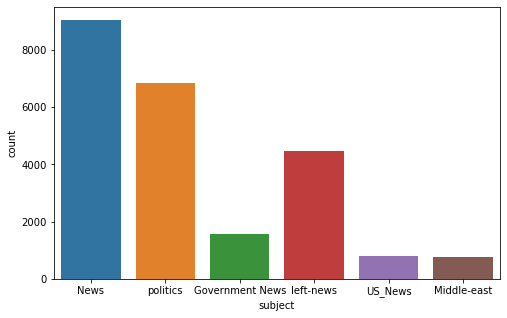

In [22]:
# plot subjects for fakes
plt.figure(figsize=(8,5))
sns.countplot("subject", data=fake_df)
plt.show()

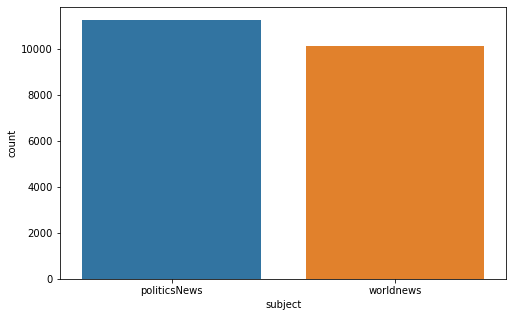

In [23]:
# Plot subjects for true
plt.figure(figsize=(8,5))
sns.countplot("subject", data=true_df)
plt.show()

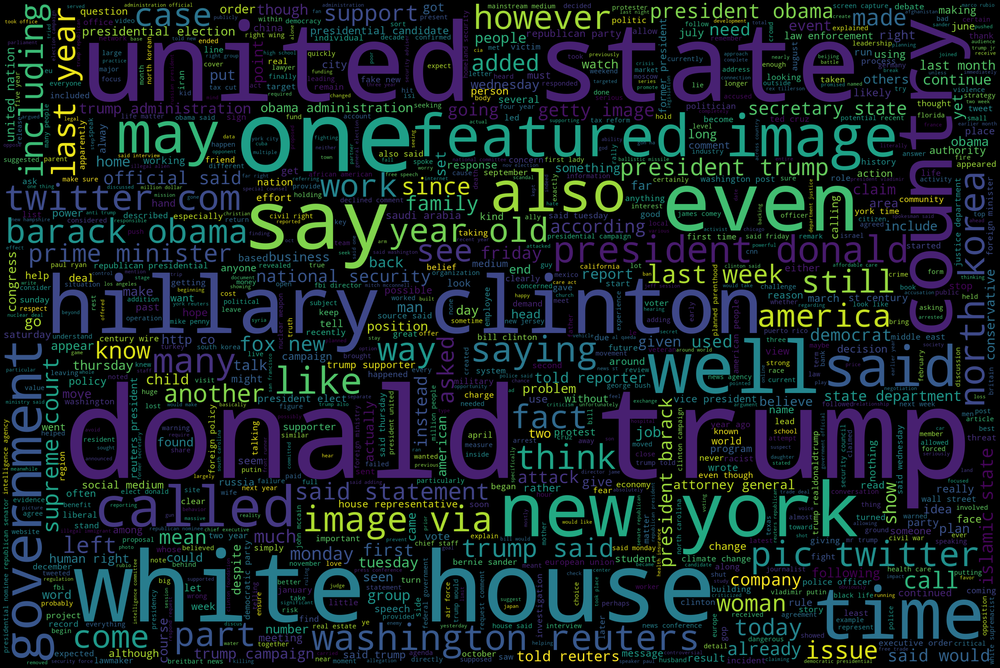

In [24]:
# Generate wordcloud displaying the most common words used in the combined news
text = " ".join(text for text in news.text)

wordcloud = WordCloud(
background_color="black",
width = 3000,
height = 2000,
max_words=1000,
stopwords = set(nltk.corpus.stopwords.words("english")),
random_state=42).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

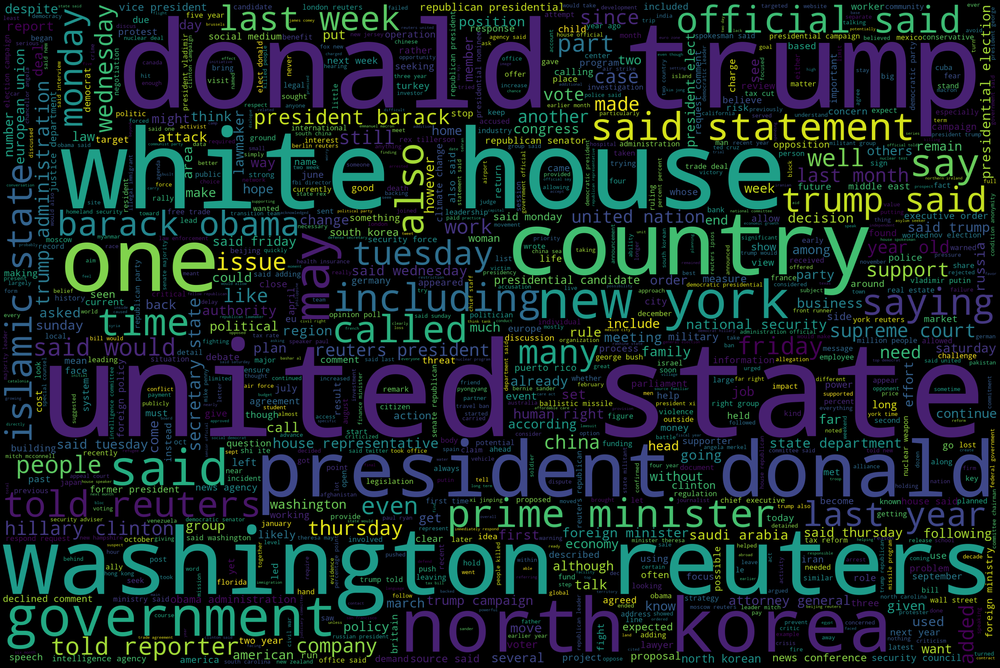

In [25]:
# Generate wordcloud displaying the most common words used in the true news
text = " ".join(text for text in true_df.text)

wordcloud = WordCloud(
background_color="black",
width = 3000,
height = 2000,
max_words=1000,
stopwords = set(nltk.corpus.stopwords.words("english")),
random_state=42).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

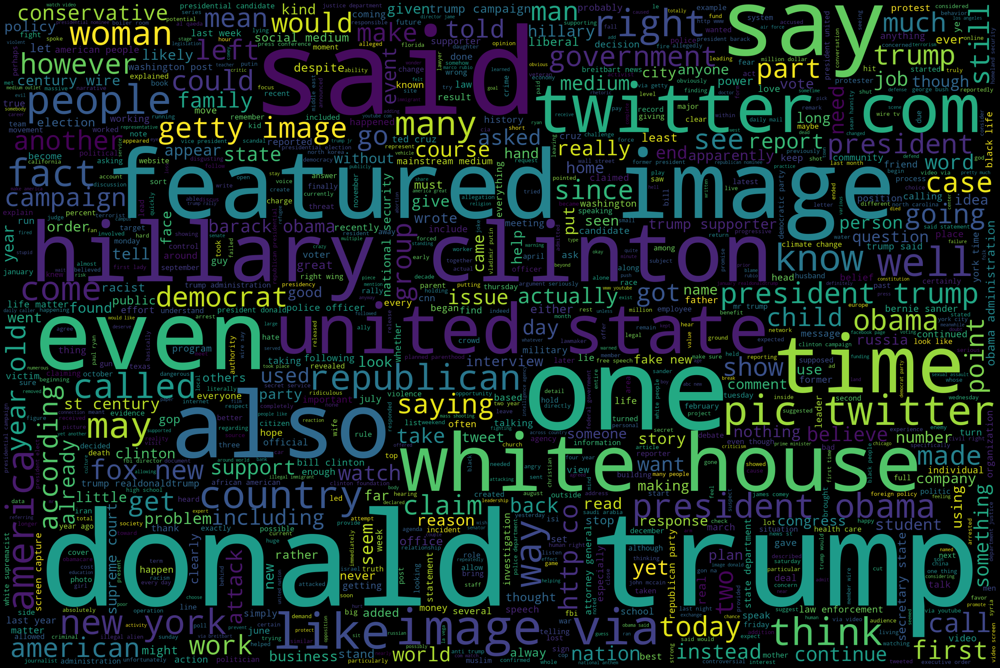

In [26]:
# Generate wordcloud displaying the most common words used in the fake news
text = " ".join(text for text in fake_df.text)

wordcloud = WordCloud(
background_color="black",
width = 3000,
height = 2000,
max_words=1000,
stopwords = set(nltk.corpus.stopwords.words("english")),
random_state=42).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

## Second Data Cleaning

From my exploratory data analysis and my data visualization I noticed that most of the trues contain source news organizations like Reuters. Something we can also see clearly in the wordcloud.
It would seem Reuters, is a common factor for true news in the dataset, and to avoid this poluting my outcomes I will now clean the data of interferences like that.

Below we can see the trues that don't contain Reuters in the text, just to see the weight of the issue.

In [27]:
# trues that dont contain Reuters
true_df[true_df["text"].str.contains('reuters')==False]

,title,text,subject,date,target
103,Democratic U.S. senator seeks audit of EPA chi...,washington top democrat senate environment com...,politicsNews,"December 18, 2017",true
427,Factbox: Republicans to watch in U.S. Senate t...,washington key u senator still concern republi...,politicsNews,"November 30, 2017",true
1141,GAO opens door for Congress to review leverage...,new york ifr investigative arm congress decide...,politicsNews,"October 19, 2017",true
3488,White House unveils list of ex-lobbyists grant...,white house wednesday disclosed group former l...,politicsNews,"June 1, 2017",true
4358,Factbox: Trump Supreme Court appointee to affe...,neil gorsuch president donald trump appointee ...,politicsNews,"April 7, 2017",true
5363,Trump's defense chief visits UAE in first Midd...,abu dhabi u president donald trump defense sec...,politicsNews,"February 18, 2017",true
5784,Trump Supreme Court nominee Gorsuch seen in th...,federal appeal court judge neil gorsuch u supr...,politicsNews,"February 1, 2017",true
5821,Kushner divests equity in major NYC property,new york ifr jared kushner divested equity int...,politicsNews,"January 31, 2017",true
6823,Commentary: Trump can't fight Islamic State wi...,course u presidential campaign donald trump ch...,politicsNews,"December 7, 2016",true
7365,Tough reality check for Trump's pledge of bett...,charlotte north carolina donald trump promise ...,politicsNews,"November 10, 2016",true


Only 39 true news stories doesnt contain Reuters, if we had let this slip then the prediction would most likely base it's prediction on this. (I tried and it sure did)

In [28]:
# find everything that is poluted
noreuters_count = len(true_df[true_df["text"].str.contains('reuters')==False])
total_trues = len(true_df)

print("True news that doesnt contain Reuters:", noreuters_count)
print("True news total news stories:", total_trues)

True news that doesnt contain Reuters: 39
True news total news stories: 21417


In [29]:
# add new stopwords
sw_list = ['reuters','com']
stop.extend(sw_list)

# clean the combined text again
news['text'] = news['text'].apply(lambda x: clean_text(x))
news

,title,text,subject,date,target
0,Donald Trump Sends Out Embarrassing New Year’...,donald trump wish american happy new year leav...,News,"December 31, 2017",fake
1,Drunk Bragging Trump Staffer Started Russian ...,house intelligence committee chairman devin nu...,News,"December 31, 2017",fake
2,Sheriff David Clarke Becomes An Internet Joke...,friday revealed former milwaukee sheriff david...,News,"December 30, 2017",fake
3,Trump Is So Obsessed He Even Has Obama’s Name...,christmas day donald trump announced would bac...,News,"December 29, 2017",fake
4,Pope Francis Just Called Out Donald Trump Dur...,pope francis used annual christmas day message...,News,"December 25, 2017",fake
...,...,...,...,...,...
44893,'Fully committed' NATO backs new U.S. approach...,brussels nato ally tuesday welcomed president ...,worldnews,"August 22, 2017",true
44894,LexisNexis withdrew two products from Chinese ...,london lexisnexis provider legal regulatory bu...,worldnews,"August 22, 2017",true
44895,Minsk cultural hub becomes haven from authorities,minsk shadow disused soviet era factory minsk ...,worldnews,"August 22, 2017",true
44896,Vatican upbeat on possibility of Pope Francis ...,moscow vatican secretary state cardinal pietro...,worldnews,"August 22, 2017",true


## Training Data

Now it's time to train the data so we can fit it into our models

In [30]:
Y = news.target
# X = news.title
# X = news.subject
# X = news.date
X = news.text
test_size = 0.20
random_state = 200

# Creating and training data
x_train,x_test,y_train,y_test = train_test_split(X, Y, test_size=test_size, random_state=random_state)

After trying all the different columns I found that the text column seems to contain the most data and it seems to create the most precise predictions.

In [31]:
# Creating and training data
x_train,x_test,y_train,y_test = train_test_split(X, Y, test_size=test_size, random_state=random_state)

## Predicting using different classifiers

### Multinomial Naive Bayes Classifier

In [32]:
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', MultinomialNB())])

model = pipe.fit(x_train, y_train)
prediction = model.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))

accuracy: 93.0%


In [33]:
mnbc_score = round(accuracy_score(y_test, prediction)*100,2)
mnbc_score

93.0

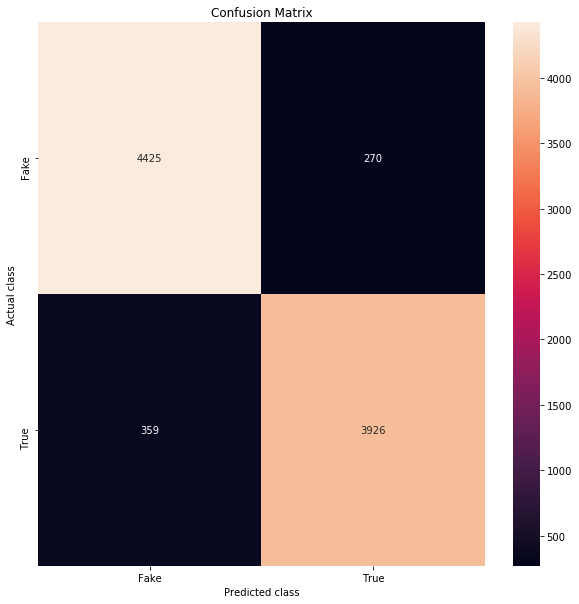

In [34]:
LABELS = ['Fake', 'True'] 
conf_matrix = confusion_matrix(y_test, prediction) 
plt.figure(figsize =(10, 10)) 
sns.heatmap(conf_matrix, xticklabels = LABELS, 
yticklabels = LABELS, annot = True, fmt ="d"); 
plt.title("Confusion Matrix") 
plt.ylabel('Actual class') 
plt.xlabel('Predicted class') 
plt.show()

In [35]:
print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

        fake       0.92      0.94      0.93      4695
        true       0.94      0.92      0.93      4285

    accuracy                           0.93      8980
   macro avg       0.93      0.93      0.93      8980
weighted avg       0.93      0.93      0.93      8980



### Bernoulli Naive Bayes Classifier

In [36]:
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', BernoulliNB())])

model = pipe.fit(x_train, y_train)
prediction = model.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))

accuracy: 93.62%


In [37]:
bnbc_score = round(accuracy_score(y_test, prediction)*100,2)
bnbc_score

93.62

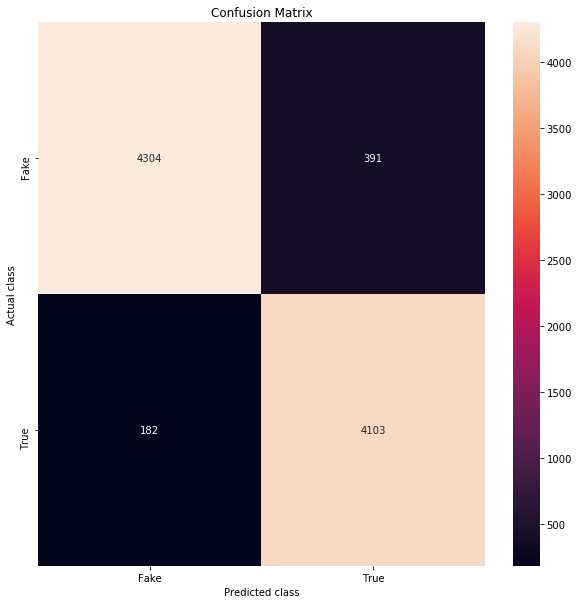

In [38]:
LABELS = ['Fake', 'True'] 
conf_matrix = confusion_matrix(y_test, prediction) 
plt.figure(figsize =(10, 10)) 
sns.heatmap(conf_matrix, xticklabels = LABELS, 
yticklabels = LABELS, annot = True, fmt ="d"); 
plt.title("Confusion Matrix") 
plt.ylabel('Actual class') 
plt.xlabel('Predicted class') 
plt.show()

In [39]:
print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

        fake       0.96      0.92      0.94      4695
        true       0.91      0.96      0.93      4285

    accuracy                           0.94      8980
   macro avg       0.94      0.94      0.94      8980
weighted avg       0.94      0.94      0.94      8980



### Decision Tree

In [40]:
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', DecisionTreeClassifier())])

model = pipe.fit(x_train, y_train)
prediction = model.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))

accuracy: 94.91%


In [41]:
dtc_score = round(accuracy_score(y_test, prediction)*100,2)
dtc_score

94.91

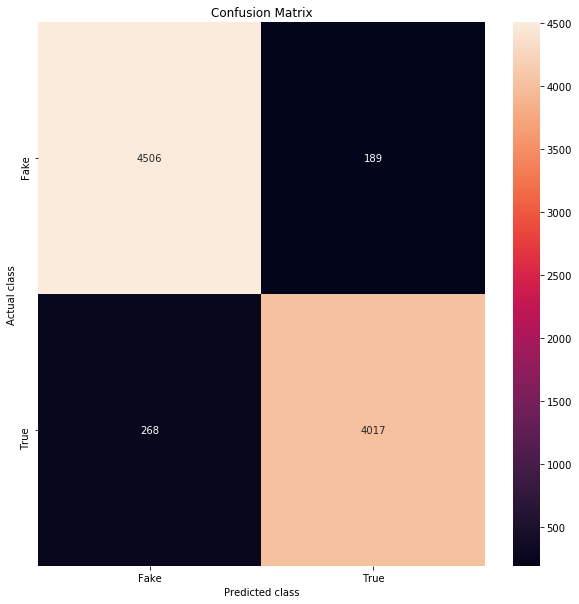

In [42]:
LABELS = ['Fake', 'True'] 
conf_matrix = confusion_matrix(y_test, prediction) 
plt.figure(figsize =(10, 10)) 
sns.heatmap(conf_matrix, xticklabels = LABELS, 
yticklabels = LABELS, annot = True, fmt ="d"); 
plt.title("Confusion Matrix") 
plt.ylabel('Actual class') 
plt.xlabel('Predicted class') 
plt.show()

In [43]:
print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

        fake       0.94      0.96      0.95      4695
        true       0.96      0.94      0.95      4285

    accuracy                           0.95      8980
   macro avg       0.95      0.95      0.95      8980
weighted avg       0.95      0.95      0.95      8980



### Random Forest

In [44]:
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', RandomForestClassifier())])

model = pipe.fit(x_train, y_train)
prediction = model.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))

accuracy: 98.1%


In [45]:
rfc_score = round(accuracy_score(y_test, prediction)*100,2)
rfc_score

98.1

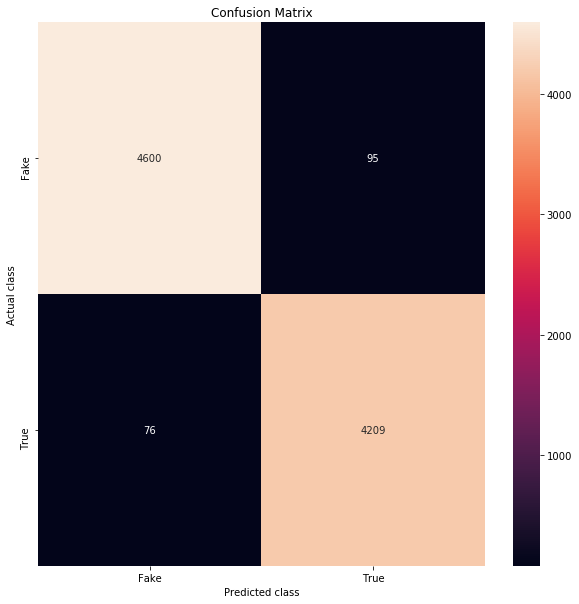

In [46]:
LABELS = ['Fake', 'True'] 
conf_matrix = confusion_matrix(y_test, prediction) 
plt.figure(figsize =(10, 10)) 
sns.heatmap(conf_matrix, xticklabels = LABELS, 
yticklabels = LABELS, annot = True, fmt ="d"); 
plt.title("Confusion Matrix") 
plt.ylabel('Actual class') 
plt.xlabel('Predicted class') 
plt.show()

In [47]:
print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

        fake       0.98      0.98      0.98      4695
        true       0.98      0.98      0.98      4285

    accuracy                           0.98      8980
   macro avg       0.98      0.98      0.98      8980
weighted avg       0.98      0.98      0.98      8980



## Classifier Comparison

In [48]:
scores = {
dtc_score:'Decision Tree Classifier',
rfc_score:'Random Forest Classifier',
mnbc_score:'Multinomial Naive Bayes Classifier',
bnbc_score:'Bernoulli Naive Bayes Classifier'
}

print("Accuracy scores in percent:")
print()
print("* Decision Tree Classifier: {}%".format(dtc_score))
print("* Random Forest Classifier: {}%".format(rfc_score))
print("* Multinomial Naive Bayes Classifier: {}%".format(mnbc_score))
print("* Bernoulli Naive Bayes Classifier: {}%".format(bnbc_score))
print()
print("Best classifier is", scores[max(scores)])

Accuracy scores in percent:

* Decision Tree Classifier: 94.91%
* Random Forest Classifier: 98.1%
* Multinomial Naive Bayes Classifier: 93.0%
* Bernoulli Naive Bayes Classifier: 93.62%

Best classifier is Random Forest Classifier


## Testing the best classifier on unknown data

In [49]:
models = {
dtc_score: DecisionTreeClassifier(),
rfc_score: RandomForestClassifier(),
mnbc_score: BernoulliNB(),
bnbc_score: MultinomialNB()
}

best_model = models[max(scores)]

pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', best_model)])

model = pipe.fit(x_train, y_train)
prediction = model.predict(x_test)
print("Model used: ", best_model)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))

Model used:  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
accuracy: 98.03%


In [50]:
# Locate a true news and a fake news
print(news.iloc[44895])
print()
print()
print(news.iloc[2])

title      Minsk cultural hub becomes haven from authorities
text       minsk shadow disused soviet era factory minsk ...
subject                                            worldnews
date                                        August 22, 2017 
target                                                  true
Name: 44895, dtype: object


title       Sheriff David Clarke Becomes An Internet Joke...
text       friday revealed former milwaukee sheriff david...
subject                                                 News
date                                       December 30, 2017
target                                                  fake
Name: 2, dtype: object


In [51]:
# predict the two news using our model
print('Prediction of two known news articles:')
print("Known fake news:['true'] =>", model.predict([news.iloc[44895].text]))
print("Known true news:['fake'] =>", model.predict([news.iloc[2].text]))

Prediction of two known news articles:
Known fake news:['true'] => ['true']
Known true news:['fake'] => ['fake']


#### Unknown News story from Reuters
https://www.reuters.com/article/us-usa-economy/u-s-weekly-jobless-claims-grind-lower-but-backlogs-layoffs-linger-idUSKBN22X0C0

In [52]:
print('Unknown news prediction:', model.predict(['WASHINGTON (Reuters) - Millions more Americans filed for unemployment benefits last week as backlogs in processing claims continue to be cleared and disruptions from the novel coronavirus unleash a second wave of layoffs, pointing to another month of staggering job losses in May.The Labor Department’s weekly jobless claims report, the most timely data on the economy’s health, showed a surge to a record high in the number of people on unemployment rolls, suggested that businesses were probably in no rush to rehire workers as they reopen.A broad shutdown of the country in mid-March to contain the spread of COVID-19, the respiratory illness caused by the novel coronavirus, has resulted in the worst unemployment since the Great Depression.“The states may be opening back up, but the labor market is still closed for millions across America and the loss of the income and spending of those without jobs will be a considerable headwind for this economic recovery,” said Chris Rupkey, chief economist at MUFG in New York.Initial claims for state unemployment benefits fell 249,000 to a seasonally adjusted 2.438 million in the week ended May 16, the government said on Thursday. Data for the prior week was revised to show 294,000 fewer applications received than previously reported, bringing down the tally for the week ending May to 2.687 million from 2.981 million. The states of Connecticut said last week it had misreported its numbers.Last week’s claims reading was in line with economists’ expectations, and marked the seventh straight weekly decline.There was some encouraging news. A survey from the Philadelphia Federal Reserve on Thursday showed businesses in the mid-Atlantic region were increasingly optimistic, as the six-month outlook jumped to a 2-1/2 year high in May.U.S. stock indexes edged lower at the open on China-U.S. tensions and mixed retail earnings. The dollar was little changed against a basket of currencies, while U.S. Treasury prices rose.GRADUAL DECLINEClaims have been gradually declining since hitting a record 6.867 million in the week ended March 28.Economists said claims numbers were staying high as states were now processing applications for gig workers and many others trying to access federal government’s Pandemic Unemployment Assistance (PUA) program.These workers generally do not qualify for regular unemployment insurance, but to get federal aid for coronavirus-related job and income losses they must first file for state benefits and be denied.Last week’s filings lift the number of people who filed claims for unemployment benefits to about 38.6 million since March 21.Economists caution that this figure did not represent the number of jobs lost due to the pandemic, because of the technical difficulties and procedures at state unemployment offices. They also noted that this number could include people who have since found jobs.Last week’s claims data covered the week during which the government surveyed establishments for the nonfarm payrolls portion of May’s employment report.Claims dropped by 2 million between the April and May survey weeks. The economy lost a record 20.5 million jobs in April.With the initial claims numbers being distorted by processing issues, attention has shifted to the number of people staying on unemployment benefits rolls. These so-called continuing claims numbers are reported with a one-week lag, but are considered a better gauge of the labor market.Continuing claims could also offer a glimpse into how soon the economy ramps up. They can also gauge companies’ ability to get people off unemployment or keep workers on payrolls as they access their share of a historic fiscal package worth nearly $3 trillion, which offered loans that could be partially forgiven if they were used for employee salaries.Continuing claims surged 2.525 million to a record 25.073 million in the week ending May 9.“The sharp rise in continuing claims the week before illustrates that the easing of lockdowns in many states has not yet resulted in any large-scale recall to work for those currently on temporary layoff,” said Paul Ashworth, chief U.S. economist at Capital Economics in Toronto.The government reported that 6.1 million people had their applications for the PUA program processed in the week ending May 2. An additional 2.227 million had submitted claims last week under the PUA program. A total of 27.282 million people were receiving benefits under state and federal government programs in the week ending May 2.']))

Unknown news prediction: ['true']


#### Unknown news story from The Onion (A parody news website)
https://www.theonion.com/nation-s-politicians-law-enforcement-corporate-execut-1843568548

In [53]:
print('Unknown news prediction:', model.predict(['NEW YORK (The Onion) - Expressing disbelief that they were so fortunate to experience a true golden age of prosperity and technological wonder, the nation’s politicians, law enforcement officers, and executives marveled Wednesday at the futuristic utopia they get to live in. “To think that I have all this at my fingertips, whether it’s automated high-volume stock trading or unlimited surveillance footage of my employees, it’s like something out of a science fiction paradise,” said pharmaceutical executive Ron Pollard, who claimed previous generations of police officers, elected officials, and business leaders could never comprehend the world of unlimited possibilities that has been created for them, where they are free to do whatever they want all the time. “Walking through these plants staffed entirely by hyper-efficient robots, facial recognition cameras, maybe even luxury space travel, it’s almost like I’m living in a dream. There’s massive unemployment, and yet the stock market is surging. We’ve finally achieved a perfect society. It’s simply breathtaking to watch law enforcement arresting citizens for just going about their daily lives. Corporate lobbyists write up laws that only benefit the wealthy and elite. It’s like a never-ending dream. If Rockefeller or Henry Frick could see this sublime world, they would weep with joy. I don’t even need to employ a servant anymore when gig workers, that I can summon with the touch of a button, can do so much more at fraction of the cost.” Pollard added that with the rapid advancements of the past few decades he expected his children would inherit a world that, for them, would be even more unrestrained and full of possibilities.']))

Unknown news prediction: ['fake']


## Conclusion

From my testing I have found that RandomForest gave me the best results - after cleaning my data - with an accuracy of 98%.
DecisionTree gives a 99% accuracy if the data isn't cleaned, but that seems to be because the true news all contain the news organization Reuters in it's text, where the fakes don't. I saw how that disrupted the outcome a bit too much so I cleaned the data and here we are.

After adding Reuters as a stopword it seems the model actually works quite amazingly. After feeding it with a new - and unknown to the model - Reuters story and a parody news story from the Onion, it actually came out correct when predicting if they were real or fake.

## Store the trained model
Now that we know our model works, we can save it to our local folder be using pickle

In [54]:
dtc_model_file = 'dtc_model.pkl'

# dump the model into pkl format
with open(dtc_model_file, 'wb') as f:
    pickle.dump(model, f)

In [55]:
# print execution time of whole application
exec_time = (time.time() - start_time)
print("Program execution time:", str(datetime.timedelta(seconds=int(exec_time))))

Program execution time: 0:14:23


## WebApp

Now let's try building a webapp that dynamically predicts news to be real or fake

In [56]:
%%writefile app.py
from flask import Flask, render_template, request
import pickle
app = Flask(__name__)

# Load pickled model
with open('dtc_model.pkl', 'rb') as f:
    loaded_model_web = pickle.load(f)
    
@app.route("/")
def hello():
    return "Hello World!" 

@app.route('/predict', methods=['GET', 'POST'])
def index():
    name = "stranger"
    webprediction = "not predicted yet"
    source = ""
    newsstory = ""
    
    if request.method == 'POST' and 'name' in request.form:
        name = request.form['name']
        
    if request.method == 'POST' and 'source' in request.form:
        source = request.form['source']
        
    if request.method == 'POST' and 'newsstory' in request.form:
        newsstory = request.form['newsstory']
        
    if request.method == 'POST' and 'newsstory' in request.form:
        webprediction = loaded_model_web.predict([source + " - " + newsstory])[0]
    
    return render_template('index.html', name=name, webprediction=webprediction, source=source, newsstory=newsstory)

if __name__ == "__main__":
    app.run()

Overwriting app.py


In [ ]:
# run web app on the server
!python app.py

### Links to webapp
### [hello world](http://localhost:5000/)
### [fake news detector](http://localhost:5000/predict)

#### I recommend trying with Reuters stories since the model is based off of these, I doubt anything else will work as accurately.
#### Also avoid Covid19 stories as the model was trained with data from before Covid19
